# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%%time

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import math
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

Wall time: 1min 32s


## 1.1 Reading Data

In [2]:
# using 40k rows due to memory constraint

project_data = pd.read_csv('train_data.csv',nrows=40000)
resource_data = pd.read_csv('resources.csv')

In [3]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (40000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [5]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [6]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [7]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [8]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...


In [9]:
#### 1.4.2.3 Using Pretrained Models: TFIDF weighted W2V

In [10]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)


My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

In [11]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [12]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations. \r\n\r\nThe materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills. \r\nThey also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing

In [13]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations.     The materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills.   They also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing. Phys

In [14]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays cognitive delays gross fine motor delays to autism They are eager beavers and always strive to work their hardest working past their limitations The materials we have are the ones I seek out for my students I teach in a Title I school where most of the students receive free or reduced price lunch Despite their disabilities and limitations my students love coming to school and come eager to learn and explore Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting This is how my kids feel all the time The want to be able to move as they learn or so they say Wobble chairs are the answer and I love then because they develop their core which enhances gross motor and in Turn fine motor skills They also want to learn through games my kids do not want to sit and do worksheets They want to learn to count by jumping and playing Physical engagement is the

In [15]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [16]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())
project_data['preprocessed_essays'] = preprocessed_essays

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40000/40000 [00:43<00:00, 919.83it/s]


In [17]:
# after preprocesing
preprocessed_essays[20000]

'my kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism they eager beavers always strive work hardest working past limitations the materials ones i seek students i teach title i school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore have ever felt like ants pants needed groove move meeting this kids feel time the want able move learn say wobble chairs answer i love develop core enhances gross motor turn fine motor skills they also want learn games kids not want sit worksheets they want learn count jumping playing physical engagement key success the number toss color shape mats make happen my students forget work fun 6 year old deserves nannan'

#### Number of words in combined Essay

In [18]:
proj_essay_wrd_count = []

for word in project_data['preprocessed_essays']:
    proj_essay_wrd_count.append(len(word.split()))
project_data['proj_essay_wrd_count'] = proj_essay_wrd_count

project_data.head(3)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,my students english learners working english s...,161
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,our students arrive school eager learn they po...,109
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",true champions not always ones win guts by mia...,202


<h2><font color='red'> 1.4 Preprocessing of `project_title`</font></h2>

In [19]:
# similarly you can preprocess the titles also
# printing some random essays.
print(project_data['project_title'].values[0])
print("="*50)
print(project_data['project_title'].values[150])
print("="*50)
print(project_data['project_title'].values[1000])

Educational Support for English Learners at Home
More Movement with Hokki Stools
Sailing Into a Super 4th Grade Year


In [20]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_titles.append(sent.lower().strip())
project_data['preprocessed_titles'] = preprocessed_titles

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40000/40000 [00:02<00:00, 19522.49it/s]


In [21]:
project_data.head(3)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count,preprocessed_titles
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,my students english learners working english s...,161,educational support english learners home
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,our students arrive school eager learn they po...,109,wanted projector hungry learners
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,...,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",true champions not always ones win guts by mia...,202,soccer equipment awesome middle school students


#### Number of words in project title


In [22]:
proj_title_wrd_count = []

for word in project_data['preprocessed_titles']:
    proj_title_wrd_count.append(len(word.split()))
project_data['proj_title_wrd_count'] = proj_title_wrd_count
project_data.head(3)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count,preprocessed_titles,proj_title_wrd_count
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,my students english learners working english s...,161,educational support english learners home,5
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,our students arrive school eager learn they po...,109,wanted projector hungry learners,4
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,...,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",true champions not always ones win guts by mia...,202,soccer equipment awesome middle school students,6


In [23]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

neg = []
pos = []
neu = []
compound = []

sid = SentimentIntensityAnalyzer()

for for_sentiment  in tqdm(project_data['preprocessed_essays']):

    neg.append(sid.polarity_scores(for_sentiment)['neg']) #Negative Sentiment score
    pos.append(sid.polarity_scores(for_sentiment)['pos']) #Positive Sentiment score
    neu.append(sid.polarity_scores(for_sentiment)['neu']) #Neutral Sentiment score
    compound.append(sid.polarity_scores(for_sentiment)['compound']) #Compound Sentiment score

# Creating new features    
project_data['Essay_neg_ss']      = neg
project_data['Essay_pos_ss']      = pos
project_data['Essay_neu_ss']      = neu
project_data['Essay_compound_ss'] = compound

project_data.head(3)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40000/40000 [09:04<00:00, 73.52it/s]


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count,preprocessed_titles,proj_title_wrd_count,Essay_neg_ss,Essay_pos_ss,Essay_neu_ss,Essay_compound_ss
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,ESL Literacy,My students are English learners that are work...,my students english learners working english s...,161,educational support english learners home,5,0.012,0.144,0.844,0.9694
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,Civics_Government TeamSports,Our students arrive to our school eager to lea...,our students arrive school eager learn they po...,109,wanted projector hungry learners,4,0.048,0.283,0.669,0.9856
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,...,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",true champions not always ones win guts by mia...,202,soccer equipment awesome middle school students,6,0.122,0.219,0.659,0.9816


## 1.4.1 Project_grade preprocessing

In [24]:
project_data['project_grade_category'] = project_data['project_grade_category'].str.replace(" ", "_")
project_data['project_grade_category'].value_counts()

Grades_PreK-2    16255
Grades_3-5       13589
Grades_6-8        6170
Grades_9-12       3986
Name: project_grade_category, dtype: int64

### Preprocessing teacher_prefix

In [25]:
project_data['teacher_prefix'] = project_data['teacher_prefix'].str.replace(".","")
project_data['teacher_prefix'].value_counts()

Mrs        20907
Ms         14384
Mr          3851
Teacher      854
Dr             2
Name: teacher_prefix, dtype: int64

## 1.5 Preparing data for models

In [26]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay',
       'preprocessed_essays', 'proj_essay_wrd_count', 'preprocessed_titles',
       'proj_title_wrd_count', 'Essay_neg_ss', 'Essay_pos_ss', 'Essay_neu_ss',
       'Essay_compound_ss'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### Split data into train,test and Cross validate


In [27]:
Y = project_data['project_is_approved'].values
project_data.drop(['project_is_approved'], axis=1, inplace=True)

In [28]:
X = project_data
X.head(1)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,clean_subcategories,essay,preprocessed_essays,proj_essay_wrd_count,preprocessed_titles,proj_title_wrd_count,Essay_neg_ss,Essay_pos_ss,Essay_neu_ss,Essay_compound_ss
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs,IN,2016-12-05 13:43:57,Grades_PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,ESL Literacy,My students are English learners that are work...,my students english learners working english s...,161,educational support english learners home,5,0.012,0.144,0.844,0.9694


In [29]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, stratify=Y)

### 1.5.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

### One Hot Encode - Clean_Categories


In [30]:
# we use count vectorizer to convert the values into one hot encoded features

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)

from sklearn.feature_extraction.text import CountVectorizer
vectorizer_categories = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_categories.fit(X_train['clean_categories'].values)


categories_one_hot_train = vectorizer_categories.fit_transform(X_train['clean_categories'].values)
categories_one_hot_test = vectorizer_categories.transform(X_test['clean_categories'].values)

print("After vectorizations")

print("Shape of Train data - one hot encoding ",categories_one_hot_train.shape)
print("Shape of Test data - one hot encoding ",categories_one_hot_test.shape)
print("="*100)
print(vectorizer_categories.get_feature_names())
print("="*100)

(26800, 25) (26800,)
(13200, 25) (13200,)
After vectorizations
Shape of Train data - one hot encoding  (26800, 9)
Shape of Test data - one hot encoding  (13200, 9)
['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']


### One Hot Encode - Clean_Sub-Categories

In [31]:
# we use count vectorizer to convert the values into one 
print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)


vectorizer_sub_cat = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_sub_cat.fit(X_train['clean_subcategories'].values)

sub_cat_one_hot_train = vectorizer_sub_cat.fit_transform(X_train['clean_subcategories'].values)
sub_cat_one_hot_test = vectorizer_sub_cat.transform(X_test['clean_subcategories'].values)

print("After vectorizations")

print("Shape of Train data - one hot encoding ",sub_cat_one_hot_train.shape)
print("Shape of Test data - one hot encoding",sub_cat_one_hot_test.shape)
print("="*100)

print(vectorizer_sub_cat.get_feature_names())
print("="*100)


(26800, 25) (26800,)
(13200, 25) (13200,)
After vectorizations
Shape of Train data - one hot encoding  (26800, 30)
Shape of Test data - one hot encoding (13200, 30)
['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'ForeignLanguages', 'Civics_Government', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']


In [32]:
# you can do the similar thing with state, teacher_prefix and project_grade_category also

### One Hot Encode - School_States

In [33]:
my_counter = Counter()
for state in project_data['school_state'].values:
    my_counter.update(state.split())

In [34]:
school_state_cat_dict = dict(my_counter)
sorted_school_state_cat_dict = dict(sorted(school_state_cat_dict.items(), key=lambda kv: kv[1]))

In [35]:
## we use count vectorizer to convert the values into one hot encoded features

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)

vectorizer_school_state = CountVectorizer(vocabulary=list(sorted_school_state_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_school_state.fit(X_train['school_state'].values)

school_state_one_hot_train = vectorizer_school_state.fit_transform(X_train['school_state'].values)
school_state_one_hot_test = vectorizer_school_state.transform(X_test['school_state'].values)

print("After vectorizations")


print("Shape of Train data - one hot encoding",school_state_one_hot_train.shape)
print("Shape of Test data - one hot encoding",school_state_one_hot_test.shape)
print("="*100)
print(vectorizer_school_state.get_feature_names())
print("="*100)

(26800, 25) (26800,)
(13200, 25) (13200,)
After vectorizations
Shape of Train data - one hot encoding (26800, 51)
Shape of Test data - one hot encoding (13200, 51)
['VT', 'WY', 'ND', 'MT', 'RI', 'NH', 'SD', 'AK', 'NE', 'DE', 'WV', 'HI', 'ME', 'NM', 'DC', 'KS', 'ID', 'IA', 'AR', 'CO', 'MN', 'MS', 'OR', 'KY', 'MD', 'NV', 'AL', 'CT', 'UT', 'TN', 'WI', 'VA', 'NJ', 'AZ', 'OK', 'MA', 'LA', 'WA', 'MO', 'IN', 'OH', 'PA', 'MI', 'SC', 'GA', 'IL', 'NC', 'FL', 'TX', 'NY', 'CA']


### One Hot Encode - Project_Grade_Category

In [36]:
my_counter = Counter()
for project_grade in project_data['project_grade_category'].values:
    my_counter.update(project_grade.split())

In [37]:
project_grade_cat_dict = dict(my_counter)
sorted_project_grade_cat_dict = dict(sorted(project_grade_cat_dict.items(), key=lambda kv: kv[1]))

In [38]:
## we use count vectorizer to convert the values into one hot encoded features

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)

vectorizer_project_grade_cat = CountVectorizer(vocabulary=list(sorted_project_grade_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_project_grade_cat.fit(X_train['project_grade_category'].values)

project_grade_cat_one_hot_train = vectorizer_project_grade_cat.fit_transform(X_train['project_grade_category'].values)
project_grade_cat_one_hot_test = vectorizer_project_grade_cat.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print("="*100)
print("Shape of Train data - one hot encoding",project_grade_cat_one_hot_train.shape)
print("Shape of Test data - one hot encoding",project_grade_cat_one_hot_test.shape)
print("="*100)
print(vectorizer_project_grade_cat.get_feature_names())

(26800, 25) (26800,)
(13200, 25) (13200,)
After vectorizations
Shape of Train data - one hot encoding (26800, 4)
Shape of Test data - one hot encoding (13200, 4)
['Grades_9-12', 'Grades_6-8', 'Grades_3-5', 'Grades_PreK-2']


### One Hot Encode - Teacher_Prefix

In [39]:
my_counter = Counter()
for teacher_prefix in project_data['teacher_prefix'].values:
    teacher_prefix = str(teacher_prefix)
    my_counter.update(teacher_prefix.split())

In [40]:
teacher_prefix_cat_dict = dict(my_counter)
sorted_teacher_prefix_cat_dict = dict(sorted(teacher_prefix_cat_dict.items(), key=lambda kv: kv[1]))

In [41]:
vectorizer_teacher_prefix_cat = CountVectorizer(vocabulary=list(sorted_teacher_prefix_cat_dict.keys()), lowercase=False, binary=True)
vectorizer_teacher_prefix_cat.fit(X_train['teacher_prefix'].values.astype("U"))

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)

teacher_prefix_cat_one_hot_train = vectorizer_teacher_prefix_cat.fit_transform(X_train['teacher_prefix'].values.astype("U"))
teacher_prefix_cat_one_hot_test = vectorizer_teacher_prefix_cat.transform(X_test['teacher_prefix'].values.astype("U"))
print("After vectorizations")
print("="*100)

print("Shape of Train data - one hot encoding",teacher_prefix_cat_one_hot_train.shape)
print("Shape of Test data - one hot encoding ",teacher_prefix_cat_one_hot_test.shape)
print("="*100)


print(vectorizer_teacher_prefix_cat.get_feature_names())

(26800, 25) (26800,)
(13200, 25) (13200,)
After vectorizations
Shape of Train data - one hot encoding (26800, 6)
Shape of Test data - one hot encoding  (13200, 6)
['nan', 'Dr', 'Teacher', 'Mr', 'Ms', 'Mrs']


### 1.5.2 Vectorizing Text data

#### 1.5.2.1 Bag of words

#### BOW of eassys - Train/Test Data

In [42]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer_essay_bow = CountVectorizer(ngram_range=(2, 2),min_df=10,max_features=5000)
vectorizer_essay_bow.fit(X_train['preprocessed_essays'])

# BOW for essays Train Data
essay_bow_train = vectorizer_essay_bow.fit_transform(X_train['preprocessed_essays'])
print("Shape of matrix for TRAIN data ",essay_bow_train.shape)

# BOW for essays Test Data
essay_bow_test = vectorizer_essay_bow.transform(X_test['preprocessed_essays'])
print("Shape of matrix for TEST data",essay_bow_test.shape)



Shape of matrix for TRAIN data  (26800, 5000)
Shape of matrix for TEST data (13200, 5000)


#### BOW of Project Titles - Train/Test Data

In [43]:
vectorizer_title_bow = CountVectorizer(ngram_range=(2, 2),min_df=10,max_features=5000)
vectorizer_title_bow.fit(X_train['preprocessed_titles'])

# BOW for title Train Data
title_bow_train = vectorizer_title_bow.fit_transform(X_train['preprocessed_titles'])
print("Shape of matrix for TRAIN data ",title_bow_train.shape)

# BOW for title Test Data
title_bow_test = vectorizer_title_bow.transform(X_test['preprocessed_titles'])
print("Shape of matrix for TEST data",title_bow_test.shape)



Shape of matrix for TRAIN data  (26800, 808)
Shape of matrix for TEST data (13200, 808)


#### 1.5.2.2 TFIDF vectorizer for essay

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer_essay_tfidf = TfidfVectorizer(ngram_range=(2, 2),min_df=10,max_features=5000)
vectorizer_essay_tfidf.fit(X_train['preprocessed_essays'])

#tidf Train Data
essay_tfidf_train = vectorizer_essay_tfidf.fit_transform(X_train['preprocessed_essays'])
print("Shape of matrix for TRAIN data",essay_tfidf_train.shape)

#tidf Test Data
essay_tfidf_test = vectorizer_essay_tfidf.transform(X_test['preprocessed_essays'])
print("Shape of matrix for TEST data",essay_tfidf_test.shape)



Shape of matrix for TRAIN data (26800, 5000)
Shape of matrix for TEST data (13200, 5000)


#### TFIDF vectorizer for Title

In [45]:
vectorizer_title_tfidf = TfidfVectorizer(ngram_range=(2, 2),min_df=10,max_features=5000)
vectorizer_title_tfidf.fit(X_train['preprocessed_titles'])

#tidf Train Data
title_tfidf_train = vectorizer_title_tfidf.fit_transform(X_train['preprocessed_titles'])
print("Shape of matrix for TRAIN data",title_tfidf_train.shape)

#tidf Test Data
title_tfidf_test = vectorizer_title_tfidf.transform(X_test['preprocessed_titles'])
print("Shape of matrix for TEST data",title_tfidf_test.shape)



Shape of matrix for TRAIN data (26800, 808)
Shape of matrix for TEST data (13200, 808)


#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [46]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [47]:
# average Word2Vec Function
# compute average word2vec for each review.
# the avg-w2v for each sentence/review is stored in this list
def avg_w2v_vectors_func(sentance):
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    return vector

#### Train/Test  Data - Avg-W2V for essay

In [48]:
essay_avg_w2v_train = []
essay_avg_w2v_test  = []

for sentence in tqdm(X_train['preprocessed_essays']):
    essay_avg_w2v_train.append(avg_w2v_vectors_func(sentance)) # Avg-w2v for Train data
    
# Avg-w2v for Train data    
print("len(essay_avg_w2v_train):",len(essay_avg_w2v_train))
print("len(essay_avg_w2v_train[0])",len(essay_avg_w2v_train[0]))

for sentence in tqdm(X_test['preprocessed_essays']):
    essay_avg_w2v_test.append(avg_w2v_vectors_func(sentance)) # Avg-w2v for Test data

# Avg-w2v for Test data
print("len(essay_avg_w2v_test):",len(essay_avg_w2v_test))
print("len(essay_avg_w2v_test[0])",len(essay_avg_w2v_test[0]))




100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26800/26800 [00:13<00:00, 1915.81it/s]


len(essay_avg_w2v_train): 26800
len(essay_avg_w2v_train[0]) 300


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13200/13200 [00:06<00:00, 1949.46it/s]


len(essay_avg_w2v_test): 13200
len(essay_avg_w2v_test[0]) 300


In [49]:
title_avg_w2v_train = []
title_avg_w2v_test  = []

for sentence in tqdm(X_train['preprocessed_titles']):
    title_avg_w2v_train.append(avg_w2v_vectors_func(sentance)) # Avg-w2v for Train data
    
# Avg-w2v for Train data    
print("len(title_avg_w2v_train):",len(title_avg_w2v_train))
print("len(title_avg_w2v_train[0])",len(title_avg_w2v_train[0]))

for sentence in tqdm(X_test['preprocessed_titles']):
    title_avg_w2v_test.append(avg_w2v_vectors_func(sentance)) # Avg-w2v for Test data

# Avg-w2v for Test data
print("len(title_avg_w2v_test):",len(title_avg_w2v_test))
print("len(title_avg_w2v_test[0])",len(title_avg_w2v_test[0]))

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26800/26800 [00:00<00:00, 32507.35it/s]


len(title_avg_w2v_train): 26800
len(title_avg_w2v_train[0]) 300


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13200/13200 [00:00<00:00, 30209.49it/s]


len(title_avg_w2v_test): 13200
len(title_avg_w2v_test[0]) 300


#### 1.5.2.3 Using Pretrained Models: TFIDF weighted W2V

In [50]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['preprocessed_essays'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [51]:
# Compute  TFIDF weighted W2V for each sentence of the review.

def tf_idf_weight_func(sentence): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    return vector

#### Train/Test Data - TFIDF weighted W2V for essay

In [52]:
essay_tfidf_w2v_train = []
essay_tfidf_w2v_test  = []

for sentence in tqdm(X_train['preprocessed_essays']):
    essay_tfidf_w2v_train.append(tf_idf_weight_func(sentance)) #  TFIDF weighted W2V for Train data
print("len(essay_tfidf_w2v_train)",len(essay_tfidf_w2v_train))
print("len(essay_tfidf_w2v_train[0])",len(essay_tfidf_w2v_train[0]))

for sentence in tqdm(X_test['preprocessed_essays']):
    essay_tfidf_w2v_test.append(tf_idf_weight_func(sentance)) #  TFIDF weighted W2V for Test data
print("len(essay_tfidf_w2v_test)",len(essay_tfidf_w2v_test))
print("len(essay_tfidf_w2v_test[0])",len(essay_tfidf_w2v_test[0]))



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26800/26800 [00:01<00:00, 22659.49it/s]


len(essay_tfidf_w2v_train) 26800
len(essay_tfidf_w2v_train[0]) 300


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13200/13200 [00:00<00:00, 21934.77it/s]


len(essay_tfidf_w2v_test) 13200
len(essay_tfidf_w2v_test[0]) 300


#### Train/Test Data - Avg-W2V for essay


In [53]:
title_avg_w2v_train = []
title_avg_w2v_test  = []

for sentence in tqdm(X_train['preprocessed_titles']):
    title_avg_w2v_train.append(avg_w2v_vectors_func(sentance)) # Avg-w2v for Train data
    
# Avg-w2v for Train data    
print("len(title_avg_w2v_train):",len(title_avg_w2v_train))
print("len(title_avg_w2v_train[0])",len(title_avg_w2v_train[0]))

for sentence in tqdm(X_test['preprocessed_titles']):
    title_avg_w2v_test.append(avg_w2v_vectors_func(sentance)) # Avg-w2v for Test data

# Avg-w2v for Test data
print("len(title_avg_w2v_test):",len(title_avg_w2v_test))
print("len(title_avg_w2v_test[0])",len(title_avg_w2v_test[0]))




100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26800/26800 [00:00<00:00, 27150.25it/s]


len(title_avg_w2v_train): 26800
len(title_avg_w2v_train[0]) 300


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13200/13200 [00:00<00:00, 33486.38it/s]


len(title_avg_w2v_test): 13200
len(title_avg_w2v_test[0]) 300


#### Train/Test Data - TFIDF weighted W2V for Project Titles

In [54]:
title_tfidf_w2v_train  = []
title_tfidf_w2v_test  = []

for sentence in tqdm(X_train['preprocessed_titles']):
    title_tfidf_w2v_train.append(tf_idf_weight_func(sentance)) #  TFIDF weighted W2V for Train data
print("len(title_tfidf_w2v_train)",len(title_tfidf_w2v_train))
print("len(title_tfidf_w2v_train[0])",len(title_tfidf_w2v_train[0]))

for sentence in tqdm(X_test['preprocessed_titles']):
    title_tfidf_w2v_test.append(tf_idf_weight_func(sentance)) #  TFIDF weighted W2V for Test data
print("len(title_tfidf_w2v_test)",len(title_tfidf_w2v_test))
print("len(title_tfidf_w2v_test[0])",len(title_tfidf_w2v_test[0]))



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26800/26800 [00:01<00:00, 25855.51it/s]


len(title_tfidf_w2v_train) 26800
len(title_tfidf_w2v_train[0]) 300


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13200/13200 [00:00<00:00, 22796.54it/s]


len(title_tfidf_w2v_test) 13200
len(title_tfidf_w2v_test[0]) 300


### 1.5.3 Vectorizing Numerical features

In [55]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
X_train = pd.merge(X_train, price_data, on='id', how='left')
X_test = pd.merge(X_test, price_data, on='id', how='left')

In [56]:
from sklearn.preprocessing import Normalizer

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)
normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

normalizer.fit(X_train['price'].values.reshape(-1,1))

price_data_train = normalizer.fit_transform(X_train['price'].values.reshape(-1,1))

price_data_test = normalizer.transform(X_test['price'].values.reshape(-1,1))


print("After vectorizations")
print("="*100)
print(price_data_train.shape, Y_train.shape)
print(price_data_test.shape, Y_test.shape)
print("="*100)

(26800, 27) (26800,)
(13200, 27) (13200,)
After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


#### Vectorizing - Quantity Feature

In [57]:
normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)
normalizer.fit(X_train['quantity'].values.reshape(-1,1))

quant_train = normalizer.fit_transform(X_train['quantity'].values.reshape(-1,1))
quant_test = normalizer.transform(X_test['quantity'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(quant_train.shape, Y_train.shape)
print(quant_test.shape, Y_test.shape)
print("="*100)

(26800, 27) (26800,)
(13200, 27) (13200,)
After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


####  Vectorizing - teacher_number_of_previously_posted_projects 

In [58]:
normalizer = Normalizer()

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

print("="*100)
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

prev_no_projects_train = normalizer.fit_transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
prev_no_projects_test = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(prev_no_projects_train.shape, Y_train.shape)
print(prev_no_projects_test.shape, Y_test.shape)
print("="*100)

(26800, 27) (26800,)
(13200, 27) (13200,)
After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


####  Vectorizing - Word count title

In [59]:
normalizer = Normalizer()

normalizer.fit(X_train['proj_title_wrd_count'].values.reshape(-1,1))

title_cnt_train = normalizer.fit_transform(X_train['proj_title_wrd_count'].values.reshape(-1,1))
title_cnt_test = normalizer.transform(X_test['proj_title_wrd_count'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(title_cnt_train.shape, Y_train.shape)
print(title_cnt_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


####  Vectorizing - Essay count title

In [60]:
normalizer = Normalizer()

normalizer.fit(X_train['proj_essay_wrd_count'].values.reshape(-1,1))

essay_cnt_train = normalizer.fit_transform(X_train['proj_essay_wrd_count'].values.reshape(-1,1))
essay_cnt_test = normalizer.transform(X_test['proj_essay_wrd_count'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(title_cnt_train.shape, Y_train.shape)
print(title_cnt_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


####  Vectorizing - Sentiment Score negative

In [61]:
normalizer = Normalizer()

normalizer.fit(X_train['Essay_neg_ss'].values.reshape(-1,1))

essay_neg_train = normalizer.fit_transform(X_train['Essay_neg_ss'].values.reshape(-1,1))
essay_neg_test = normalizer.transform(X_test['Essay_neg_ss'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(essay_neg_train.shape, Y_train.shape)
print(essay_neg_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


####  Vectorizing - Sentiment Score positive

In [62]:
normalizer = Normalizer()

normalizer.fit(X_train['Essay_pos_ss'].values.reshape(-1,1))

essay_pos_train = normalizer.fit_transform(X_train['Essay_pos_ss'].values.reshape(-1,1))
essay_pos_test = normalizer.transform(X_test['Essay_pos_ss'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(essay_pos_train.shape, Y_train.shape)
print(essay_pos_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


####  Vectorizing - Sentiment Score neutral

In [63]:
normalizer = Normalizer()

normalizer.fit(X_train['Essay_neu_ss'].values.reshape(-1,1))

essay_neu_train = normalizer.fit_transform(X_train['Essay_neu_ss'].values.reshape(-1,1))
essay_neu_test = normalizer.transform(X_test['Essay_neu_ss'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(essay_neu_train.shape, Y_train.shape)
print(essay_neu_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


####  Vectorizing - Sentiment Score compound

In [64]:
normalizer = Normalizer()

normalizer.fit(X_train['Essay_compound_ss'].values.reshape(-1,1))

essay_compound_train = normalizer.fit_transform(X_train['Essay_compound_ss'].values.reshape(-1,1))
essay_compund_test = normalizer.transform(X_test['Essay_compound_ss'].values.reshape(-1,1))

print("="*100)
print("After vectorizations")
print(essay_compound_train.shape, Y_train.shape)
print(essay_compund_test.shape, Y_test.shape)
print("="*100)

After vectorizations
(26800, 1) (26800,)
(13200, 1) (13200,)


# Assignment 10: Clustering

- <font color='red'>step 1</font>: Choose any vectorizer (data matrix) that you have worked in any of the assignments, and got the best AUC value.
- <font color='red'>step 2</font>: Choose any of the <a href='https://scikit-learn.org/stable/modules/feature_selection.html'>feature selection</a>/<a href='https://scikit-learn.org/stable/modules/decomposition.html'>reduction algorithms</a> ex: selectkbest features, pretrained word vectors, model based feature selection etc and reduce the number of features to 5k features
- <font color='red'>step 3</font>: Apply all three kmeans, Agglomerative clustering, DBSCAN
    - <strong>K-Means Clustering:</strong> <br>
        ● Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)<br>
    - <strong>Agglomerative Clustering: </strong><br>
        ● Apply <a href='https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/'>agglomerative algorithm</a> and try a different number of clusters like 2,5 etc. <br>
        ● You can take less data points (as this is very computationally expensive one) to perform hierarchical clustering because they do take a considerable amount of time to run. <br>
    - <strong>DBSCAN Clustering: </strong><br>
        ● Find the best ‘eps’ using the <a href='https://stackoverflow.com/a/48558030/4084039'>elbow-knee method</a>.<br>
        ● You can take a smaller sample size for this as well.
- <font color='red'>step 4</font>: Summarize each cluster by manually observing few points from each cluster.
- <font color='red'>step 5</font>: You need to plot the word cloud with essay text for each cluster for each of algorithms mentioned in <font color='red'>step 3</font>.

### Selecting 5k best features 

In [65]:
from scipy.sparse import hstack

X_train_merge = hstack((categories_one_hot_train, sub_cat_one_hot_train, school_state_one_hot_train, project_grade_cat_one_hot_train, teacher_prefix_cat_one_hot_train, price_data_train, quant_train, prev_no_projects_train,title_tfidf_train, essay_tfidf_train)).tocsr()
X_test_merge = hstack((categories_one_hot_test, sub_cat_one_hot_test, school_state_one_hot_test, project_grade_cat_one_hot_test, teacher_prefix_cat_one_hot_test, price_data_test, quant_test, prev_no_projects_test,title_tfidf_test, essay_tfidf_test)).tocsr()

print("Final Data matrix")
print("="*100)
print(X_train_merge.shape, Y_train.shape)
print(X_test_merge.shape, Y_test.shape)
print("="*100)

Final Data matrix
(26800, 5911) (26800,)
(13200, 5911) (13200,)


In [66]:
a = vectorizer_categories.get_feature_names()
b = vectorizer_sub_cat.get_feature_names()
c = vectorizer_school_state.get_feature_names()
d = vectorizer_project_grade_cat.get_feature_names()
e = vectorizer_teacher_prefix_cat.get_feature_names()
f = vectorizer_title_tfidf.get_feature_names()
g = vectorizer_essay_tfidf.get_feature_names()

In [67]:
from itertools import chain 

feature_names_tfidf = list(chain(
a,
b,
c,
d,
e,
["Price","Quantity","Prec_no_projts"],
f,
g))

In [68]:
#https://scikit-learn.org/stable/modules/feature_selection.html

from sklearn.ensemble import ExtraTreesClassifier
import pandas as pd

clf = ExtraTreesClassifier()

df_tfidf_5k = pd.DataFrame(X_train_merge.todense())
df_tfidf_5k.columns = feature_names_tfidf

clf = clf.fit(df_tfidf_5k,Y_train)

In [69]:
# https://datascience.stackexchange.com/questions/31406/tree-decisiontree-feature-importances-numbers-correspond-to-how-features

tfidf_5k_fimpt = {}
tfidf_5k_fimpt = dict(zip(feature_names_tfidf, clf.feature_importances_))
#https://stackoverflow.com/questions/16772071/sort-dict-by-value-python
tfidf_5k_fimpt = sorted(tfidf_5k_fimpt.items(), key=lambda x: x[1], reverse=True)

tfidf_5k_fimpt = tfidf_5k_fimpt[:5000]
#https://stackoverflow.com/questions/22412258/get-the-first-element-of-each-tuple-in-a-list-in-python


tfidf_5k_fimpt = [ seq[0] for seq in tfidf_5k_fimpt if seq[1] > 0.0 ] # choosing features greater than 0
df_tfidf_5k = df_tfidf_5k[tfidf_5k_fimpt]


df_5k_test = pd.DataFrame(X_test_merge.todense(),columns = feature_names_tfidf)

df_5k_test = df_5k_test[tfidf_5k_fimpt]

## K-Means Clustering:

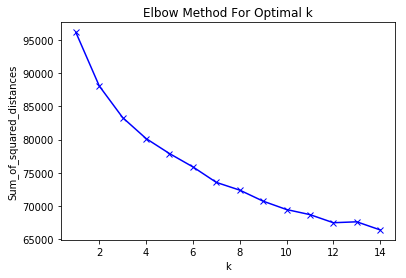

In [71]:
# https://pythonprogramminglanguage.com/kmeans-elbow-method/
# https://www.datasciencecentral.com/profiles/blogs/python-implementing-a-k-means-algorithm-with-sklearn
# https://blog.cambridgespark.com/how-to-determine-the-optimal-number-of-clusters-for-k-means-clustering-14f27070048f

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import cmath as math
import sys

Sum_of_squared_distances = []

K = range(1,15)

#Find the K-Mean

for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df_tfidf_5k)
    Sum_of_squared_distances.append(km.inertia_)
    
    
#Plotting k vs inertia

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()


### Finding the cluster count and the word cloud

In [81]:
# Optimal k value =8

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
model = KMeans(n_clusters = 8 , n_jobs = -1)
model.fit(df_tfidf_5k)

# Cluster label
clust_labels = model.labels_

# Centroid values 
cent = np.array(model.cluster_centers_)

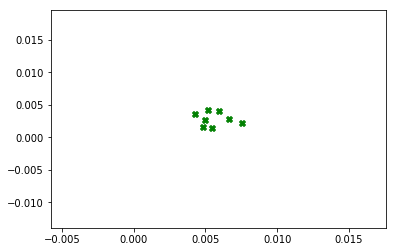

In [82]:
#https://pythonprogramminglanguage.com/kmeans-clustering-centroid/

#Plotting the centroids 
plt.scatter(cent[:,0], cent[:,1], marker="X", color='g')

In [83]:
df_tfidf_5k_tr = df_tfidf_5k

df_tfidf_5k_tr['clusters'] = clust_labels

feature_names_tfidf_tr = feature_names_tfidf
#Adding the column to our list
feature_names_tfidf_tr.extend(['clusters'])

In [84]:
#Data Points per cluster
CountStatus = pd.value_counts(df_tfidf_5k_tr['clusters'].values, sort=False)

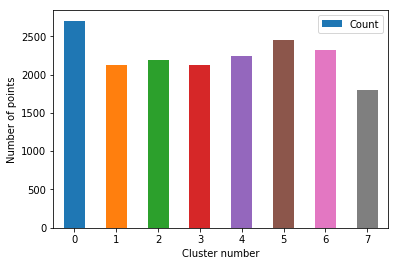

In [85]:
#Bar plot with counts of points in each cluster
cls_plt = pd.DataFrame({'Cluster': range(0,8),'Count':CountStatus})

ax = cls_plt.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

In [86]:
cls_plt

,Cluster,Count
0,0,2702
1,1,2128
2,2,2188
3,3,2125
4,4,2246
5,5,2447
6,6,2319
7,7,1801


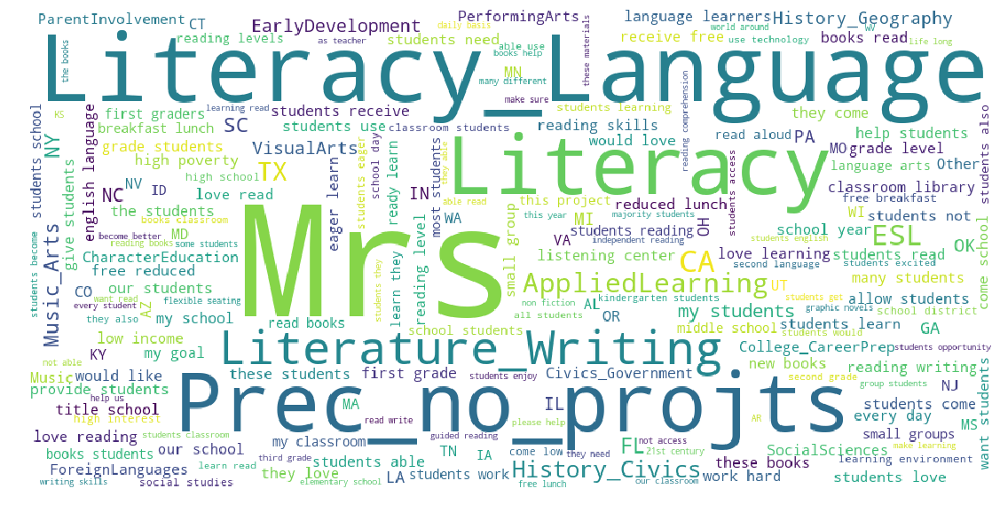

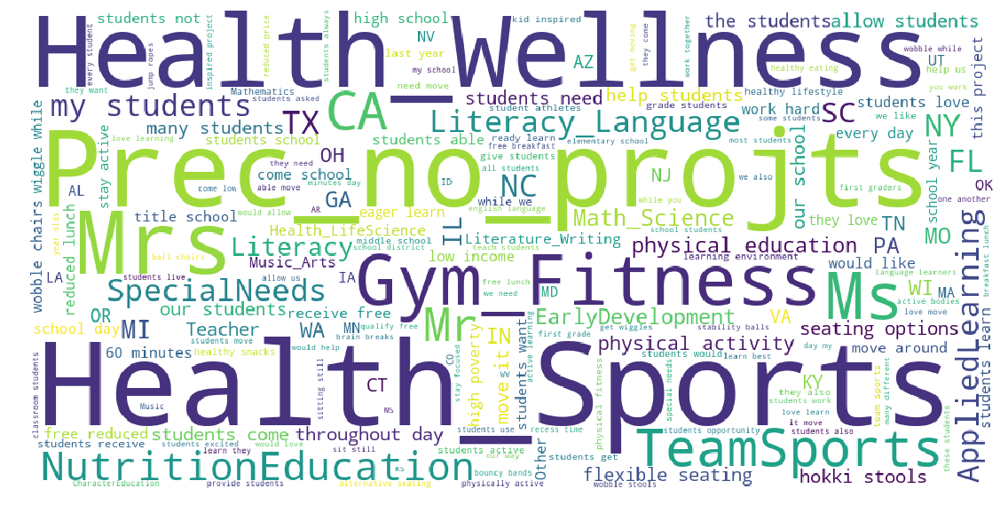

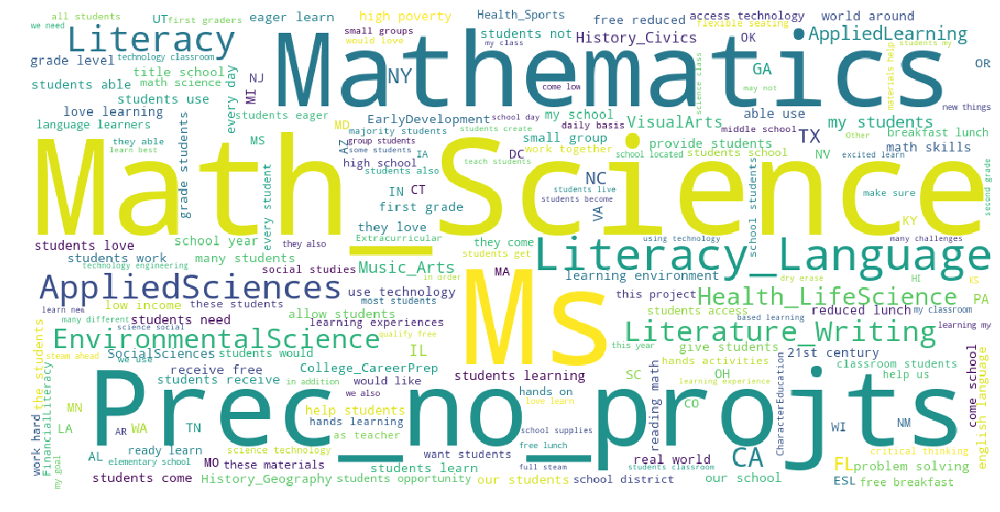

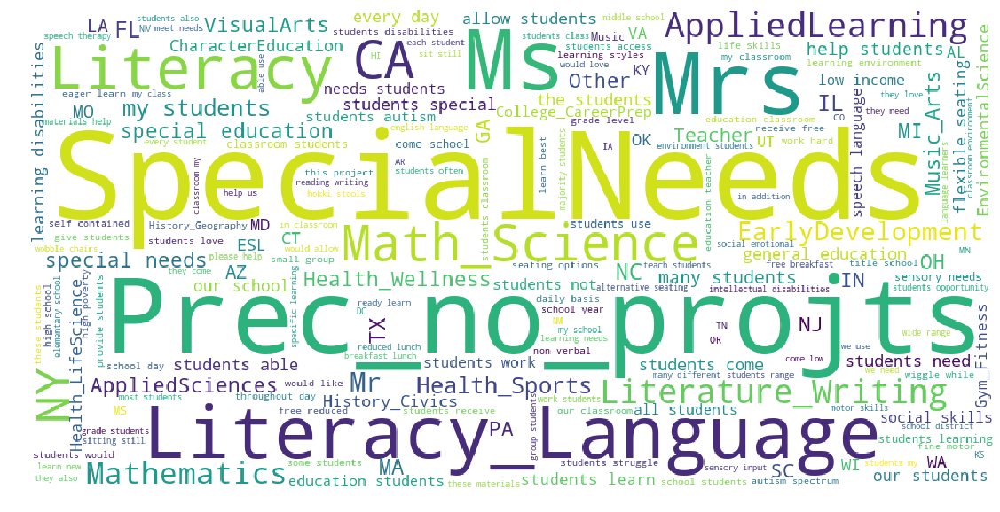

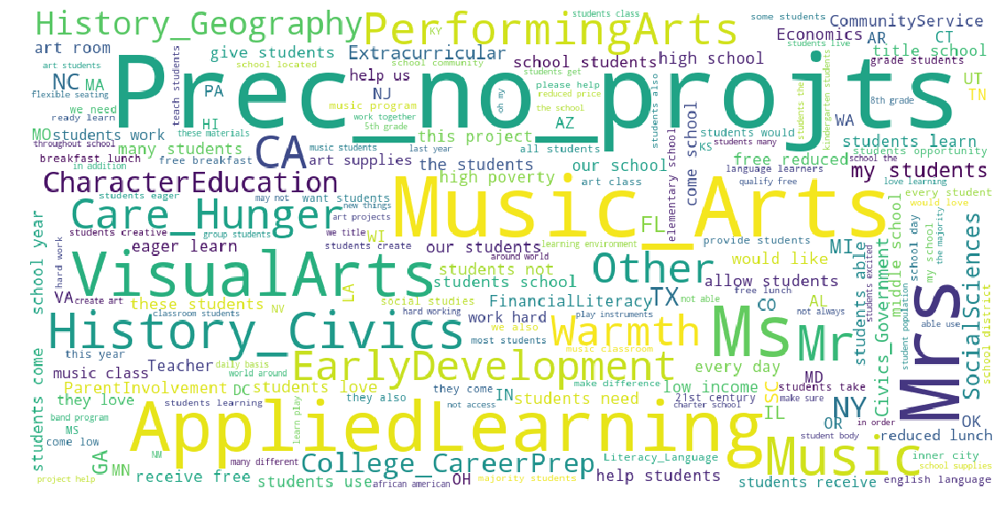

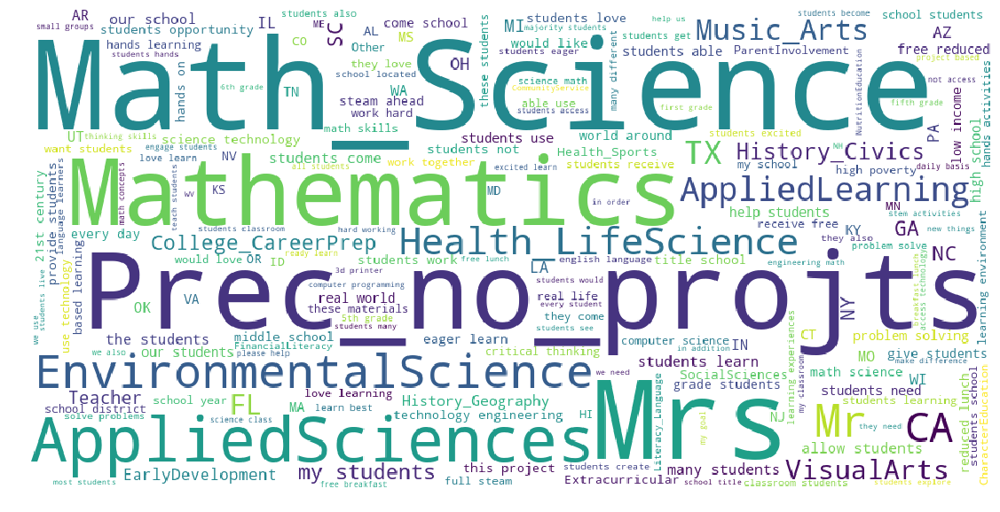

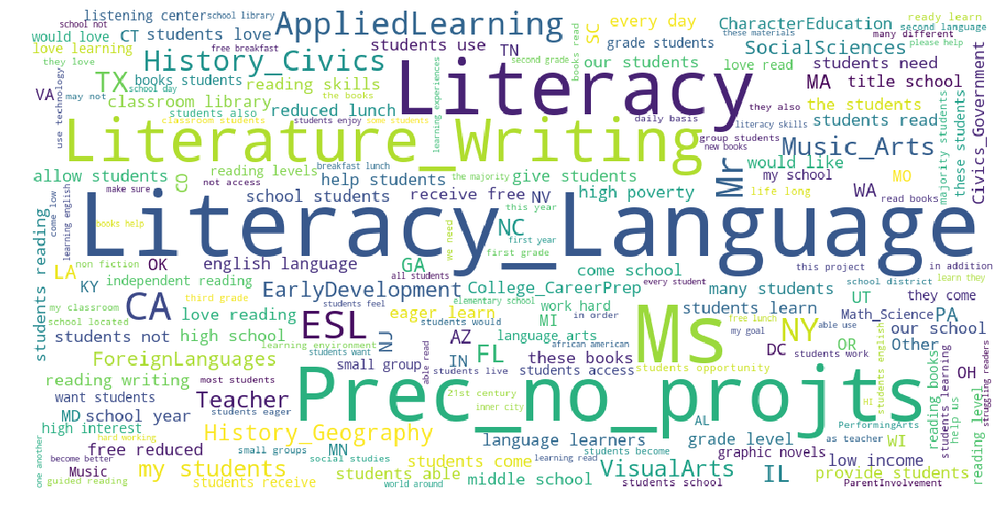

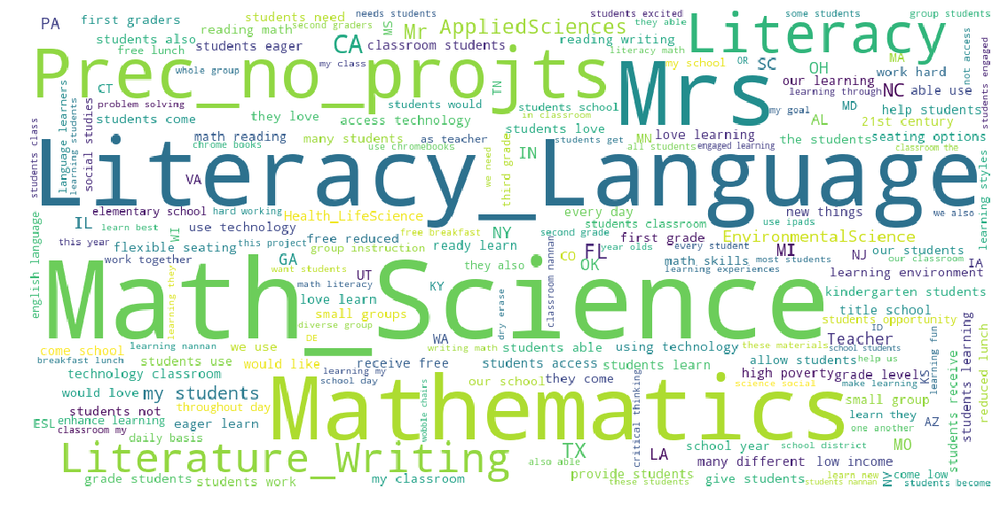

In [87]:
#https://stackoverflow.com/questions/43606339/generate-word-cloud-from-single-column-pandas-dataframe

from wordcloud import WordCloud

for i in range(0,8):
    clust = df_tfidf_5k_tr[df_tfidf_5k_tr['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

## Summary of all clusters

In [88]:
#http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Cluster","Data points","Cluster based on"]

x_pretty_table.add_row([ "K-Means","Cluster 0",2702,'Arts and History'])
x_pretty_table.add_row([ "K-Means","Cluster 1",2128,'Physical education'])
x_pretty_table.add_row([ "K-Means","Cluster 2",2188,'Maths,Science and literature'])
x_pretty_table.add_row([ "K-Means","Cluster 3",2125,'Extracurricular activities and sports'])
x_pretty_table.add_row([ "K-Means","Cluster 4",2246,'Emotional intelligence and Social care'])
x_pretty_table.add_row([ "K-Means","Cluster 5",2447,'Maths and Science'])
x_pretty_table.add_row([ "K-Means","Cluster 6",2319,'Daily used words'])
x_pretty_table.add_row([ "K-Means","Cluster 7",1801,'Maths,Technology and literature'])


print(x_pretty_table)

+------------+-----------+-------------+----------------------------------------+
| Model Type |  Cluster  | Data points |            Cluster based on            |
+------------+-----------+-------------+----------------------------------------+
|  K-Means   | Cluster 0 |     2702    |            Arts and History            |
|  K-Means   | Cluster 1 |     2128    |           Physical education           |
|  K-Means   | Cluster 2 |     2188    |      Maths,Science and literature      |
|  K-Means   | Cluster 3 |     2125    | Extracurricular activities and sports  |
|  K-Means   | Cluster 4 |     2246    | Emotional intelligence and Social care |
|  K-Means   | Cluster 5 |     2447    |           Maths and Science            |
|  K-Means   | Cluster 6 |     2319    |            Daily used words            |
|  K-Means   | Cluster 7 |     1801    |    Maths,Technology and literature     |
+------------+-----------+-------------+----------------------------------------+


## Agglomerative Clustering

### 2 Clusters

In [89]:
from sklearn.cluster import AgglomerativeClustering

amodel2 = AgglomerativeClustering(n_clusters = 2 ,affinity='euclidean',linkage='ward')
amodel2.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels2 = amodel2.labels_

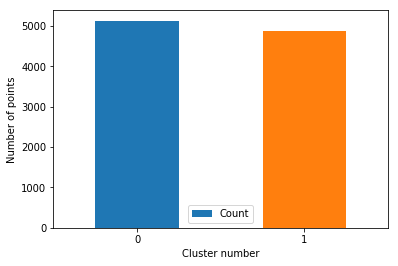

In [95]:
df_tfidf_5k_tr_a = df_tfidf_5k[:10000]

df_tfidf_5k_tr_a['clusters'] = clust_labels2

#Data Points per cluster.
CountStatus2 = pd.value_counts(df_tfidf_5k_tr_a['clusters'].values, sort=False)

#Bar plot with counts of points in each cluster
clus_agg_2 = pd.DataFrame({'Cluster': range(0,2),'Count':CountStatus2})

ax = clus_agg_2.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

In [96]:
clus_agg_2

,Cluster,Count
0,0,5132
1,1,4868


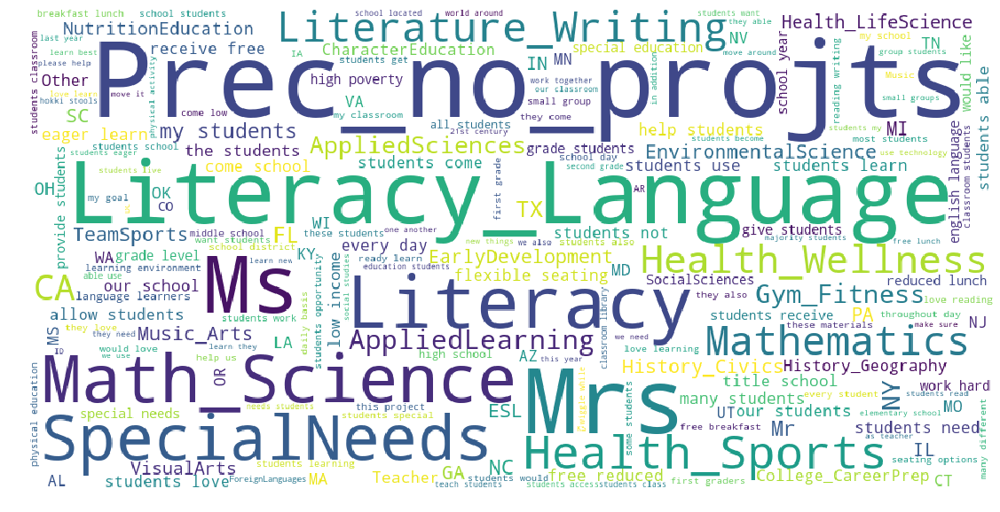

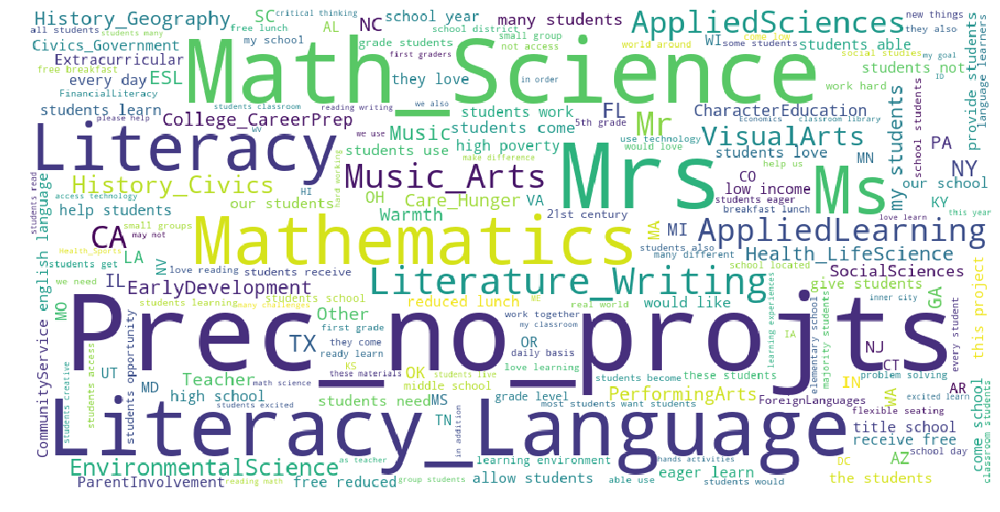

In [92]:
for i in range(0,2):
    clust = df_tfidf_5k_tr_a[df_tfidf_5k_tr_a['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

In [112]:
#http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Cluster","Data points","Cluster based on"]

x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 0",5132,'Words related to special needs'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 1",4868,'Regularly used words in daily student life'])

print(x_pretty_table)

+--------------------------+-----------+-------------+--------------------------------------------+
|        Model Type        |  Cluster  | Data points |              Cluster based on              |
+--------------------------+-----------+-------------+--------------------------------------------+
| Agglomerative Clustering | Cluster 0 |     5132    |       Words related to special needs       |
| Agglomerative Clustering | Cluster 1 |     4868    | Regularly used words in daily student life |
+--------------------------+-----------+-------------+--------------------------------------------+


### 6 Clusters

In [99]:
aggmodel_6 = AgglomerativeClustering(n_clusters = 6 ,affinity='euclidean',linkage='ward')
aggmodel_6.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels6 = aggmodel_6.labels_

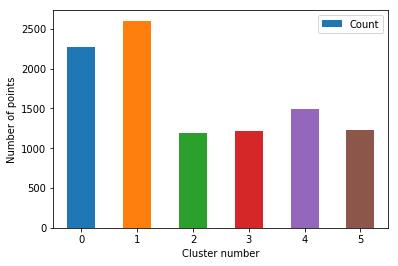

In [101]:
df_tfidf_5k_tr_a['clusters'] = clust_labels6

#Data Points per cluster.
CountStatus6 = pd.value_counts(df_tfidf_5k_tr_a['clusters'].values, sort=False)

#Bar plot with counts of points in each cluster
t = pd.DataFrame({'Cluster': range(0,6),'Count':CountStatus6})

ax = t.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

In [103]:
CountStatus6

0    2267
1    2601
2    1192
3    1215
4    1497
5    1228
dtype: int64

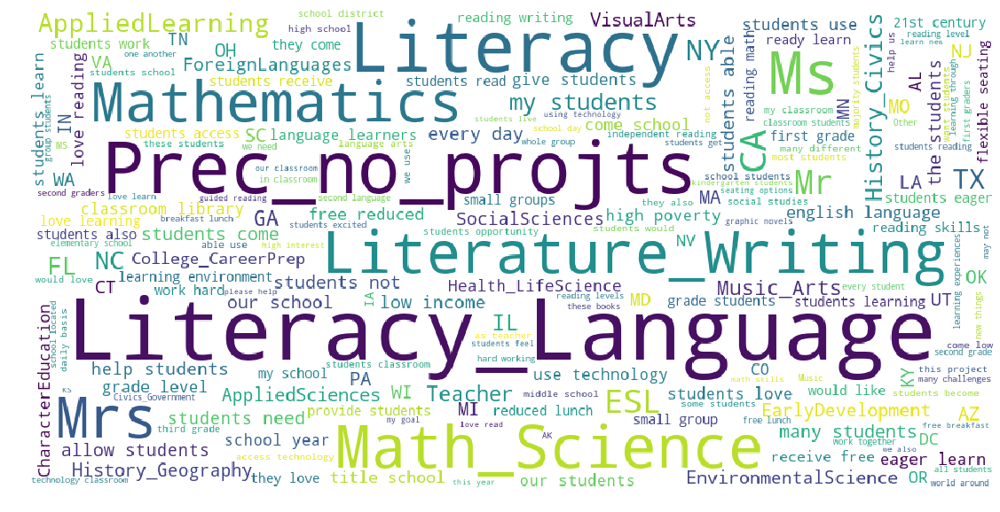

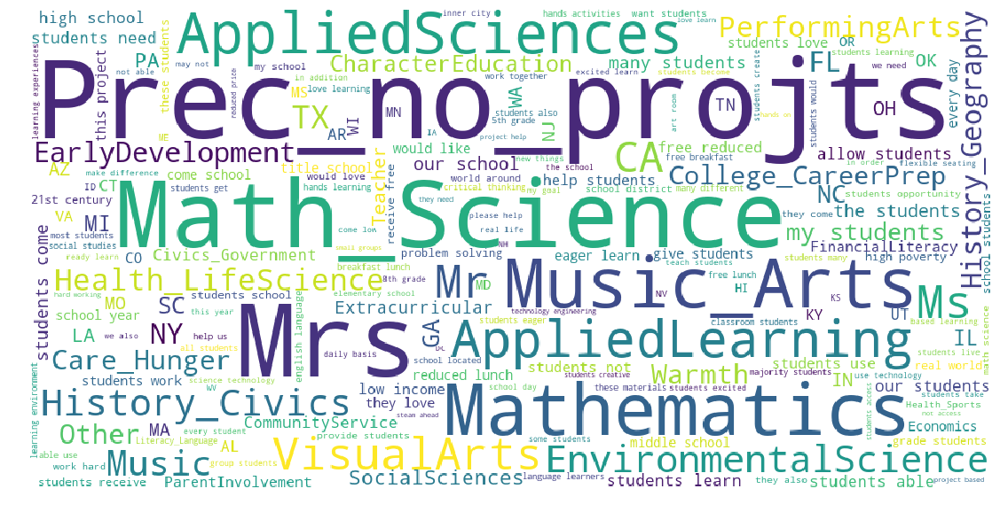

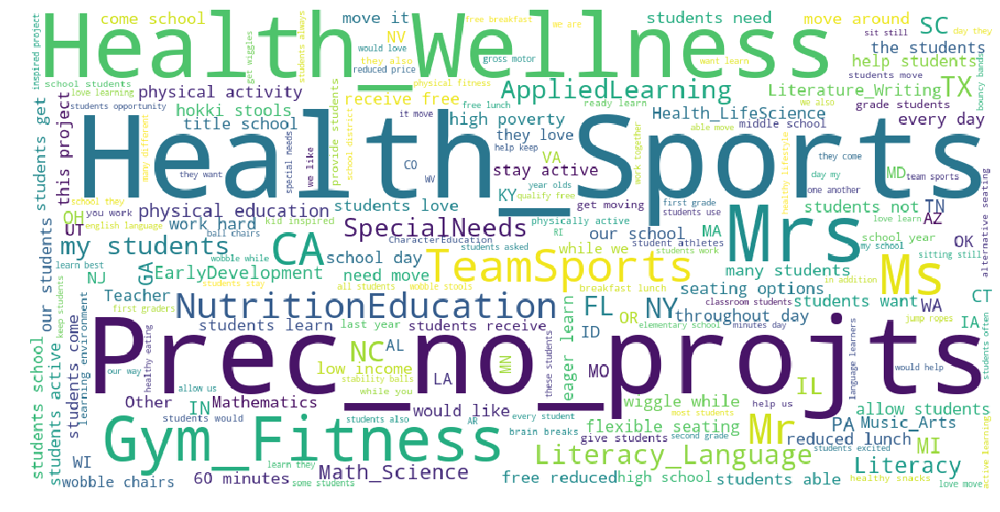

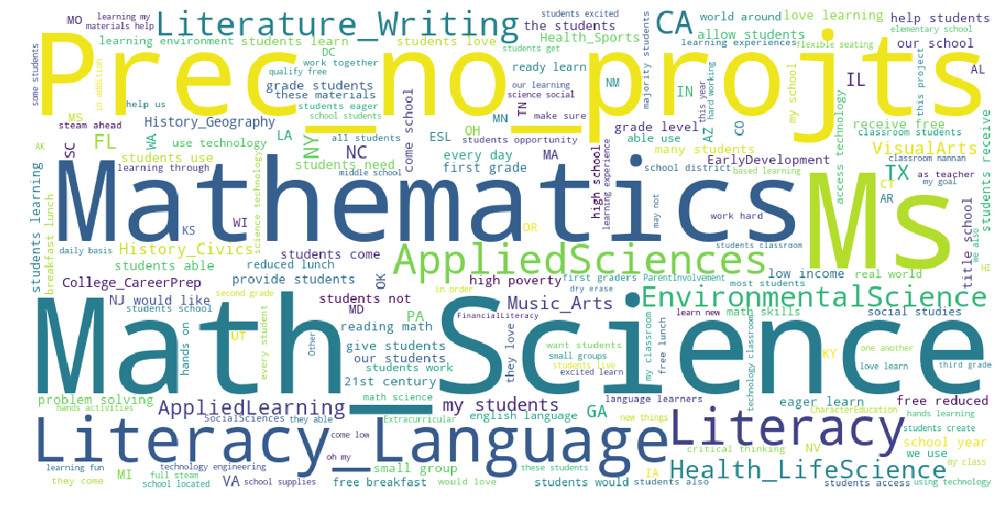

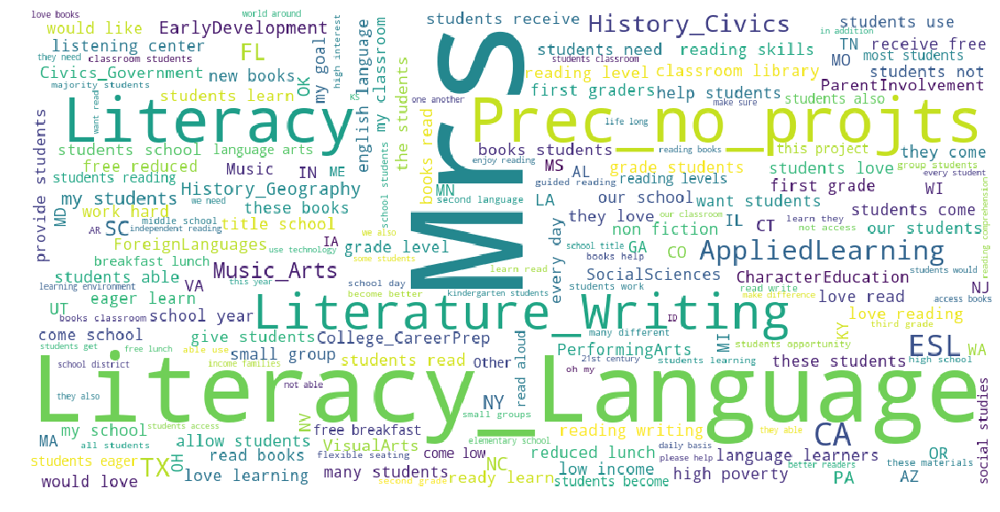

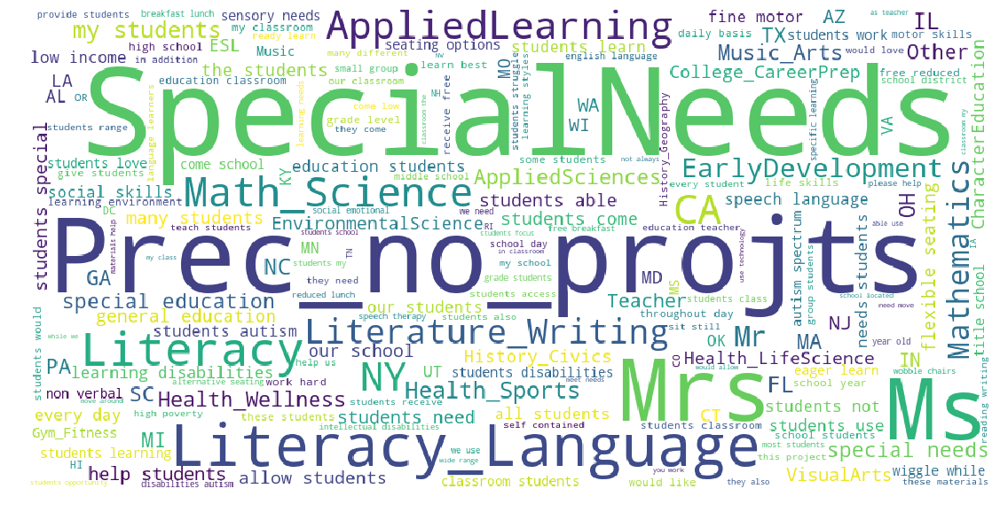

In [102]:
for i in range(0,6):
    clust = df_tfidf_5k_tr_a[df_tfidf_5k_tr_a['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

In [113]:
#http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Cluster","Data points","Cluster based on"]

x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 0",2267,'Maths and Social studies'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 1",2601,'Maths and Science'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 2",1192,'Fitness and Sports'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 3",1215,'Regularly used words in daily student life'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 4",1497,'Arts and Science'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 5",1228,'Words related to special needs '])

print(x_pretty_table)

+--------------------------+-----------+-------------+--------------------------------------------+
|        Model Type        |  Cluster  | Data points |              Cluster based on              |
+--------------------------+-----------+-------------+--------------------------------------------+
| Agglomerative Clustering | Cluster 0 |     2267    |          Maths and Social studies          |
| Agglomerative Clustering | Cluster 1 |     2601    |             Maths and Science              |
| Agglomerative Clustering | Cluster 2 |     1192    |             Fitness and Sports             |
| Agglomerative Clustering | Cluster 3 |     1215    | Regularly used words in daily student life |
| Agglomerative Clustering | Cluster 4 |     1497    |              Arts and Science              |
| Agglomerative Clustering | Cluster 5 |     1228    |      Words related to special needs        |
+--------------------------+-----------+-------------+--------------------------------------------+


### 12 Clusters

In [106]:
aggclus_12 = AgglomerativeClustering(n_clusters = 12 ,affinity='euclidean',linkage='ward')
aggclus_12.fit(df_tfidf_5k[0:10000])

# Getting the cluster labels
clust_labels12 = aggclus_12.labels_

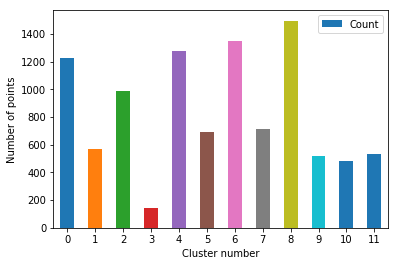

In [109]:
df_tfidf_5k_tr_a['clusters'] = clust_labels12

#Data Points per cluster.
CountStatus12 = pd.value_counts(df_tfidf_5k_tr_a['clusters'].values, sort=False)

#Bar plot with counts of points in each cluster
clust_12 = pd.DataFrame({'Cluster': range(0,12),'Count':CountStatus12})

ax = clust_12.plot.bar(x='Cluster', y='Count', rot=0)
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

In [110]:
clust_12

,Cluster,Count
0,0,1228
8,1,573
1,2,992
9,3,141
2,4,1275
10,5,694
3,6,1351
11,7,712
4,8,1497
5,9,521


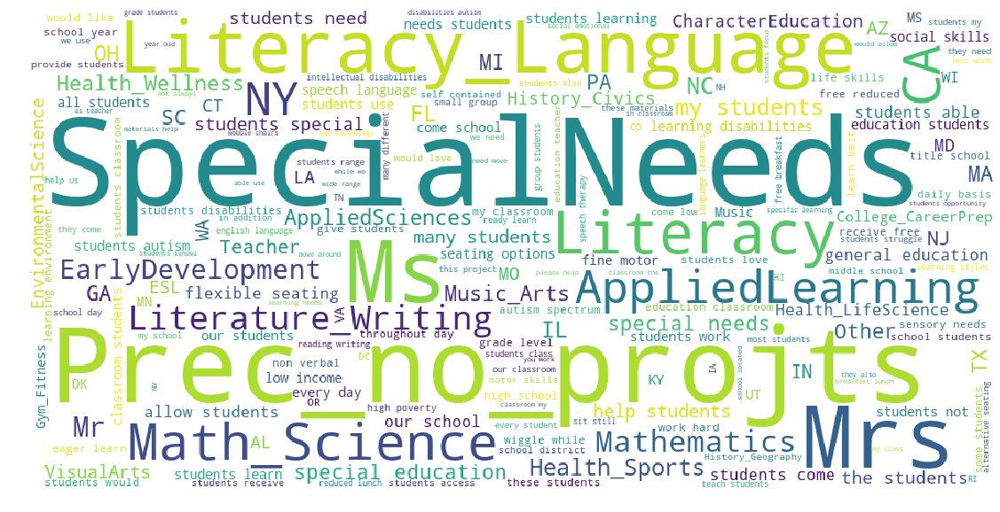

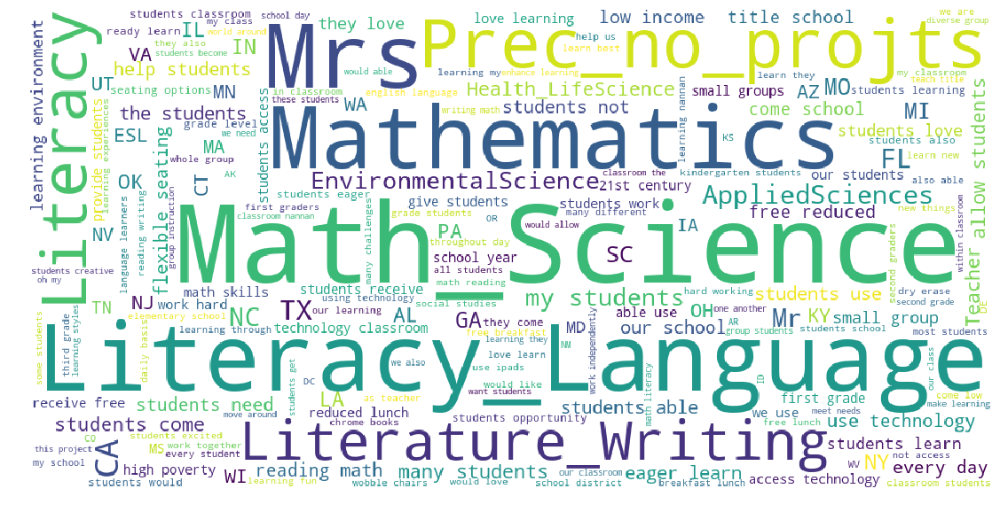

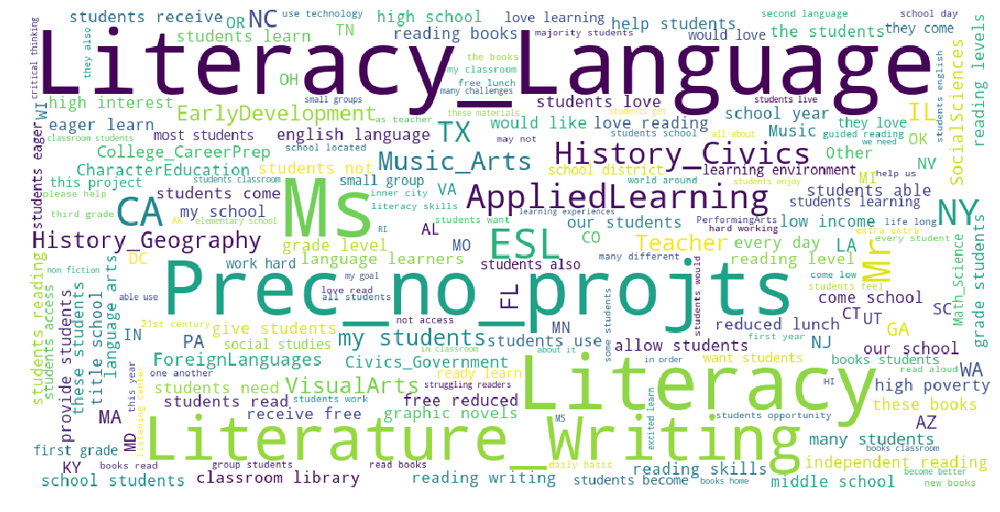

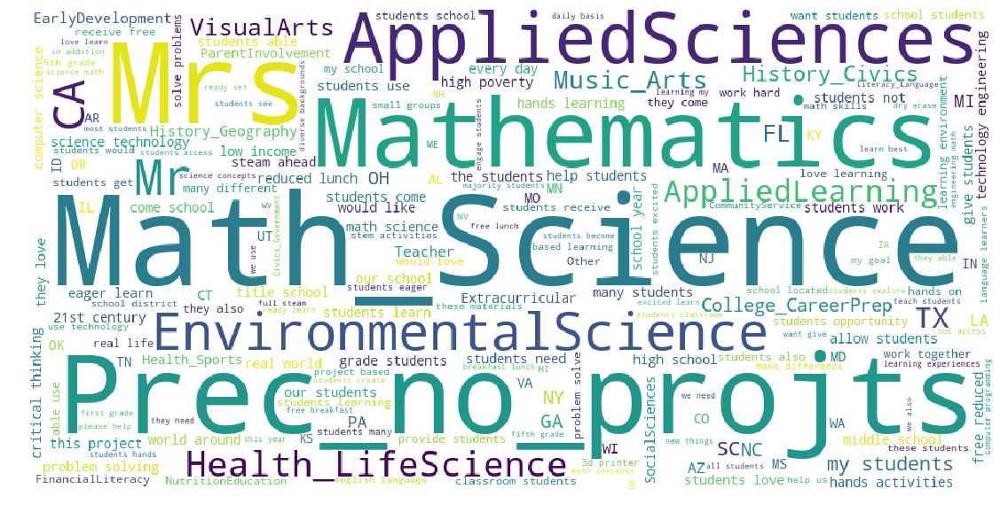

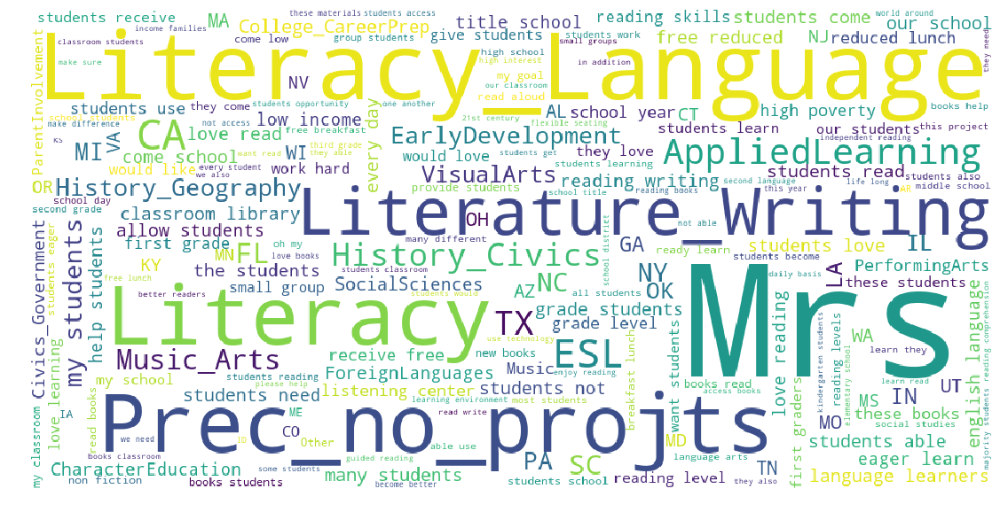

...

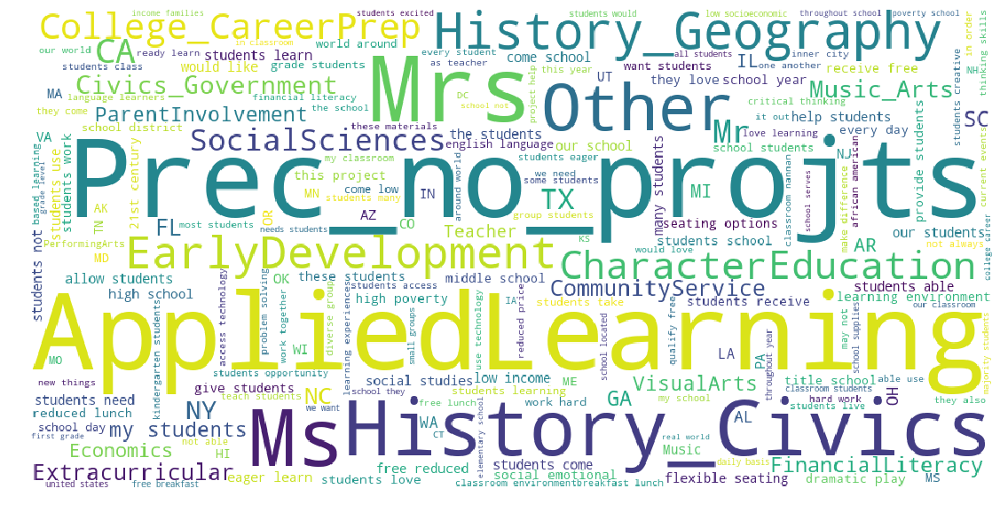

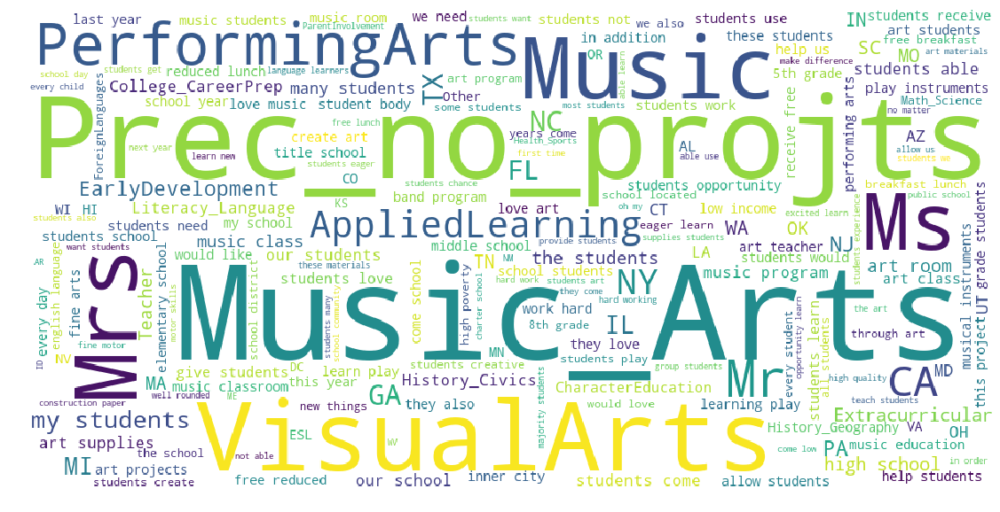

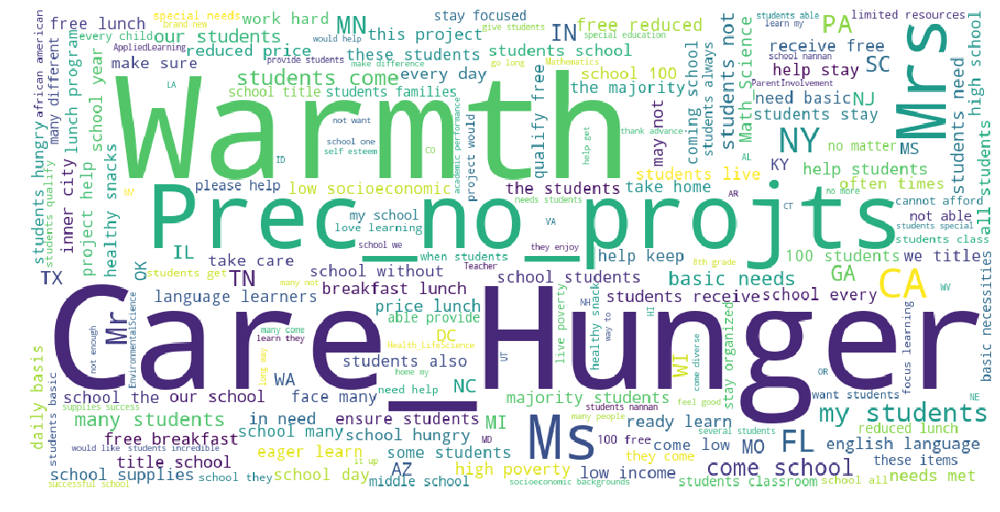

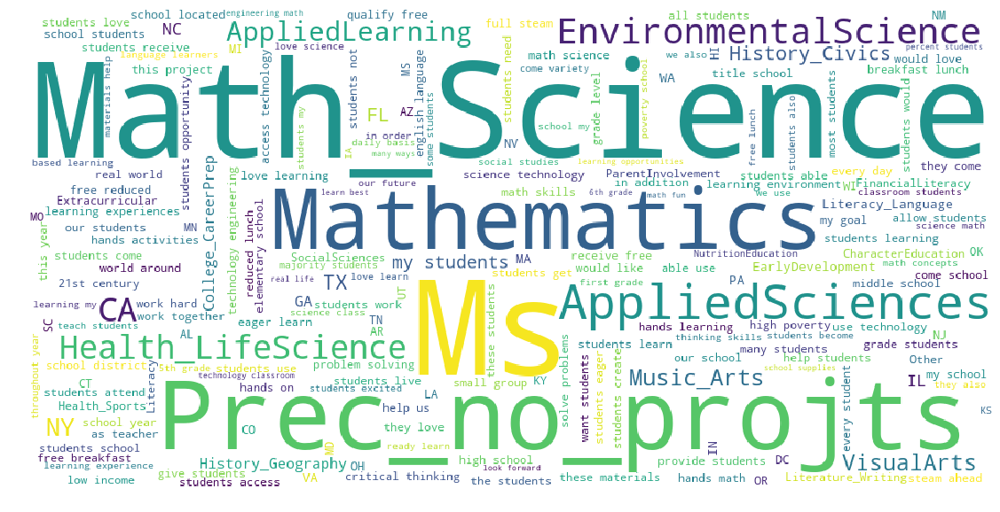

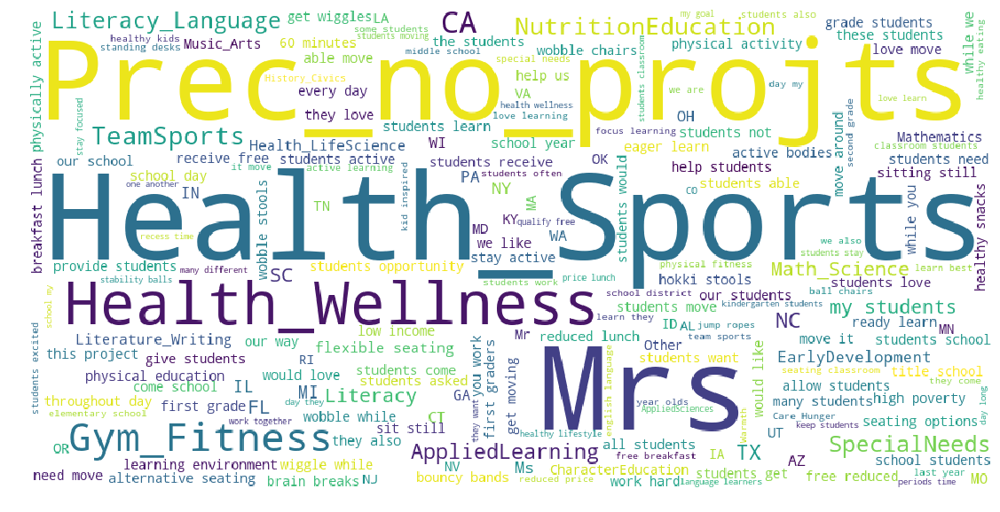

In [111]:
for i in range(0,12):
    clust = df_tfidf_5k_tr_a[df_tfidf_5k_tr_a['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

In [114]:
#http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Cluster","Data points","Cluster based on"]

x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 0",1228,'Regularly used words in daily student life '])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 1",573,'Maths,Science and Literature'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 2",992,'Arts and Literatur'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 3",141,'Maths and science'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 4",1275,'Literature and History'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 5",694,'Maths,Science and Literature'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 6",1351,'Sports and fitness'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 7",712,'Personal Development'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 8",1497,'Music and arts'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 9",521,'Care and humanity'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 10",480,'Maths and Science'])
x_pretty_table.add_row([ "Agglomerative Clustering","Cluster 11",536,'Health and Wellness'])

print(x_pretty_table)

+--------------------------+------------+-------------+---------------------------------------------+
|        Model Type        |  Cluster   | Data points |               Cluster based on              |
+--------------------------+------------+-------------+---------------------------------------------+
| Agglomerative Clustering | Cluster 0  |     1228    | Regularly used words in daily student life  |
| Agglomerative Clustering | Cluster 1  |     573     |         Maths,Science and Literature        |
| Agglomerative Clustering | Cluster 2  |     992     |              Arts and Literatur             |
| Agglomerative Clustering | Cluster 3  |     141     |              Maths and science              |
| Agglomerative Clustering | Cluster 4  |     1275    |            Literature and History           |
| Agglomerative Clustering | Cluster 5  |     694     |         Maths,Science and Literature        |
| Agglomerative Clustering | Cluster 6  |     1351    |              Sports and fi

## DBSCAN

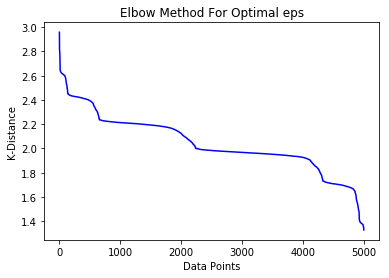

In [70]:
#https://stackoverflow.com/questions/48010276/how-to-estimate-eps-using-knn-distance-plot-in-dbscan

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

ns = 8
nbrs = NearestNeighbors(n_neighbors=ns).fit(df_tfidf_5k[0:5000])
distances, indices = nbrs.kneighbors(df_tfidf_5k[0:5000])
distanceDec = sorted(distances[:,ns-1], reverse=True)

plt.plot(list(range(1,5000+1)), distanceDec,'b-')

plt.xlabel('Data Points')
plt.ylabel('K-Distance')
plt.title('Elbow Method For Optimal eps')
plt.show()

In [71]:
#eps=2.2

dmodel = DBSCAN(eps=2.2, min_samples=15, metric='euclidean',n_jobs= -1)

dmodel.fit(df_tfidf_5k[0:5000])

# Getting the cluster labels
clust_labels_d = dmodel.labels_

In [72]:
df_tfidf_5k_tr_d = df_tfidf_5k[0:5000]

df_tfidf_5k_tr_d['clusters'] = clust_labels_d

#Data Points per cluster.
CountStatus_d = pd.value_counts(df_tfidf_5k_tr_d['clusters'].values, sort=False)

In [73]:
labels = np.array(list(dict(CountStatus_d).keys()))
count  = np.array(list(dict(CountStatus_d).values()))

clust_dbs = pd.DataFrame(labels,columns=['Label'])
clust_dbs['Count'] = pd.DataFrame(count,columns=['Count'])

In [74]:
clust_dbs

,Label,Count
0,0,4394
1,1,49
2,2,14
3,-1,543


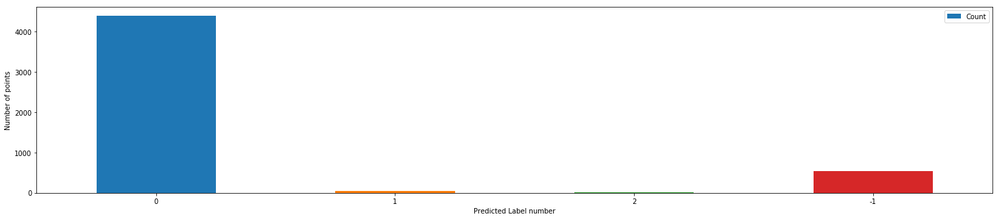

In [75]:
#Bar plot with counts of points in each cluster

ax = clust_dbs.plot.bar(x='Label', y='Count', rot=0,figsize=(25,5))
plt.xlabel("Predicted Label number")
plt.ylabel("Number of points")
plt.show()

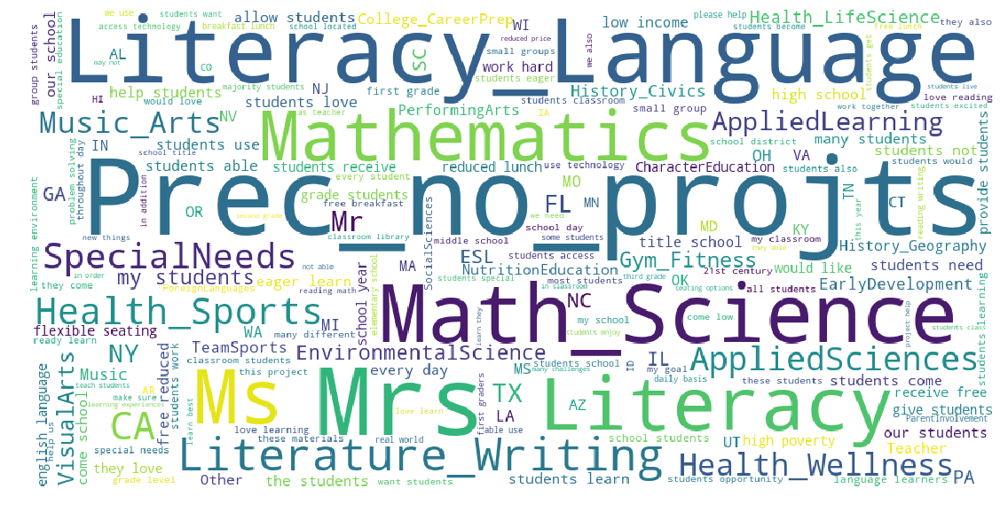

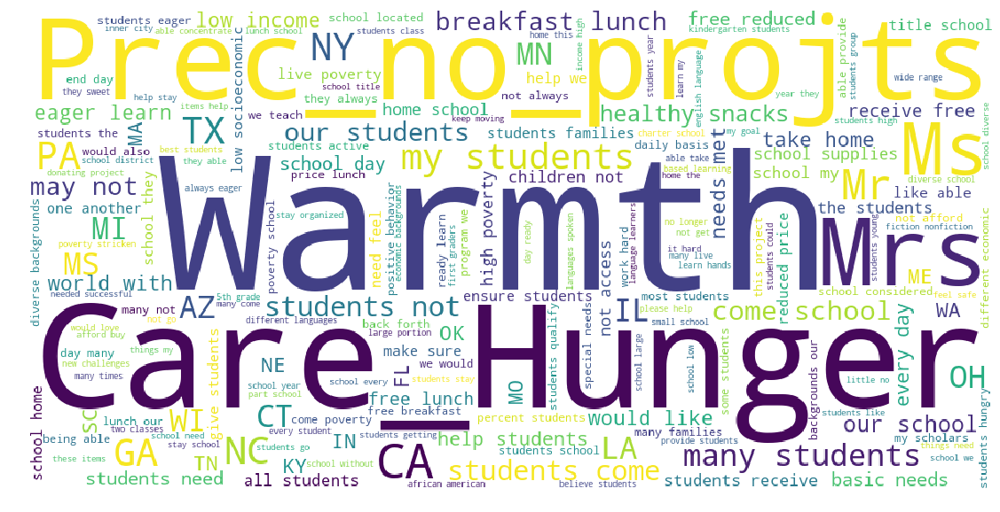

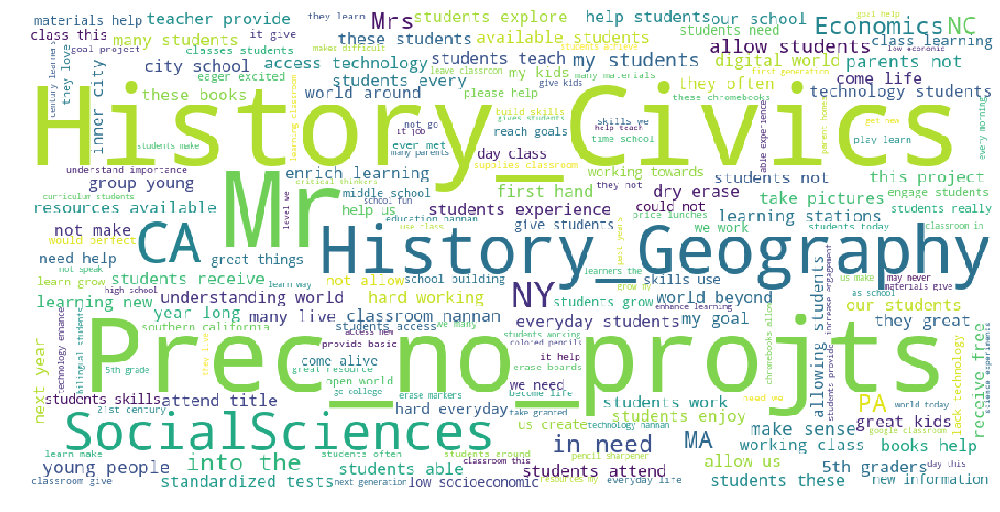

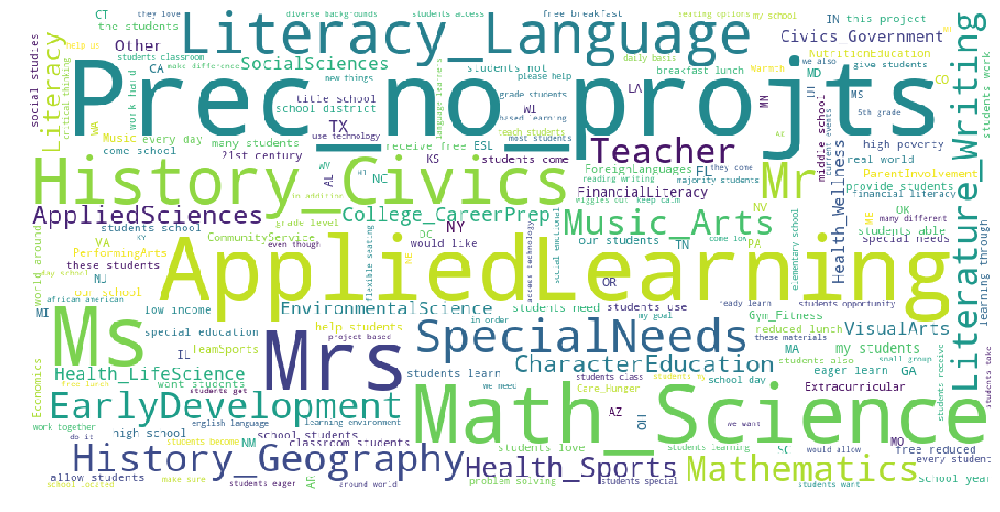

In [79]:
from wordcloud import WordCloud

for i in labels[0:5]:
    clust = df_tfidf_5k_tr_d[df_tfidf_5k_tr_d['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

In [92]:
from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Cluster","Data points","Eps","Cluster based on"]

x_pretty_table.add_row([ "DB Scan","Cluster 0",4394,2.2,'Regularly used words in daily student life '])
x_pretty_table.add_row([ "DB Scan","Cluster 1",49,2.2,'Care and humanity'])
x_pretty_table.add_row([ "DB Scan","Cluster 2",14,2.2,'Arts and science'])
x_pretty_table.add_row([ "DB Scan","Cluster -1",543,2.2,'Regularly used words in daily student life  and applied science'])
print(x_pretty_table)

+------------+------------+-------------+-----+-----------------------------------------------------------------+
| Model Type |  Cluster   | Data points | Eps |                         Cluster based on                        |
+------------+------------+-------------+-----+-----------------------------------------------------------------+
|  DB Scan   | Cluster 0  |     4394    | 2.2 |           Regularly used words in daily student life            |
|  DB Scan   | Cluster 1  |      49     | 2.2 |                        Care and humanity                        |
|  DB Scan   | Cluster 2  |      14     | 2.2 |                         Arts and science                        |
|  DB Scan   | Cluster -1 |     543     | 2.2 | Regularly used words in daily student life  and applied science |
+------------+------------+-------------+-----+-----------------------------------------------------------------+


In [80]:
# we have noise point(-1) so we need to regroup the cluster

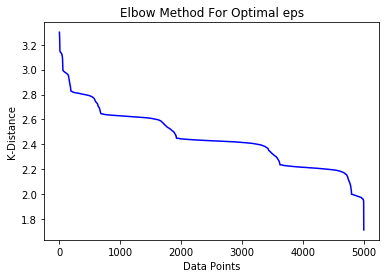

In [81]:
#https://stackoverflow.com/questions/48010276/how-to-estimate-eps-using-knn-distance-plot-in-dbscan

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

ns = 100
nbrs = NearestNeighbors(n_neighbors=ns).fit(df_tfidf_5k[0:5000])
distances, indices = nbrs.kneighbors(df_tfidf_5k[0:5000])
distanceDec = sorted(distances[:,ns-1], reverse=True)

plt.plot(list(range(1,5000+1)), distanceDec,'b-')

plt.xlabel('Data Points')
plt.ylabel('K-Distance')
plt.title('Elbow Method For Optimal eps')
plt.show()

In [82]:
#eps=2.5

dmodel = DBSCAN(eps=2.5, min_samples=20, metric='euclidean',n_jobs= -1)

dmodel.fit(df_tfidf_5k[0:5000])

# Getting the cluster labels
clust_labels_d = dmodel.labels_

In [83]:
df_tfidf_5k_tr_d = df_tfidf_5k[0:5000]

df_tfidf_5k_tr_d['clusters'] = clust_labels_d

#Data Points per cluster.
CountStatus_d = pd.value_counts(df_tfidf_5k_tr_d['clusters'].values, sort=False)

In [84]:
labels = np.array(list(dict(CountStatus_d).keys()))
count  = np.array(list(dict(CountStatus_d).values()))

clust_dbs = pd.DataFrame(labels,columns=['Label'])
clust_dbs['Count'] = pd.DataFrame(count,columns=['Count'])

In [85]:
clust_dbs

,Label,Count
0,0,4923
1,1,53
2,-1,24


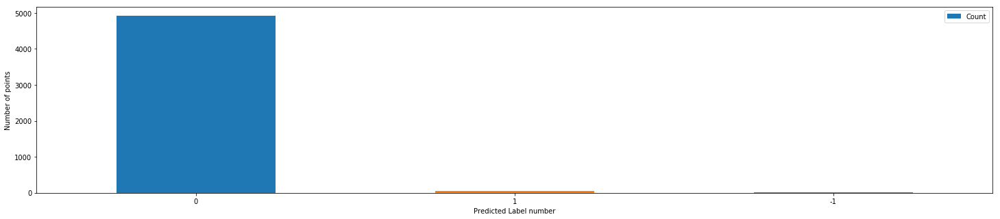

In [86]:
#Bar plot with counts of points in each cluster

ax = clust_dbs.plot.bar(x='Label', y='Count', rot=0,figsize=(25,5))
plt.xlabel("Predicted Label number")
plt.ylabel("Number of points")
plt.show()

In [165]:
# I am not able to proceed further to cluster the data points ,this might be because of using less data points

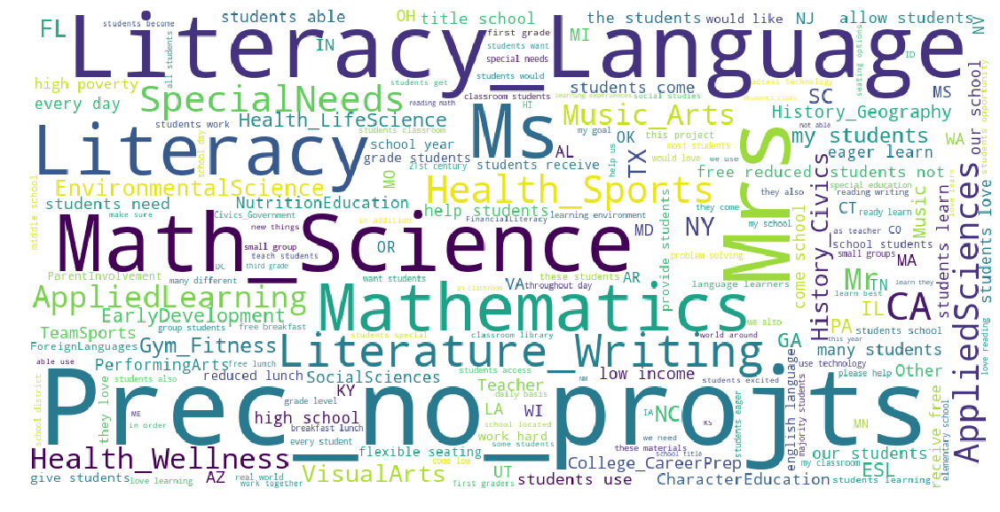

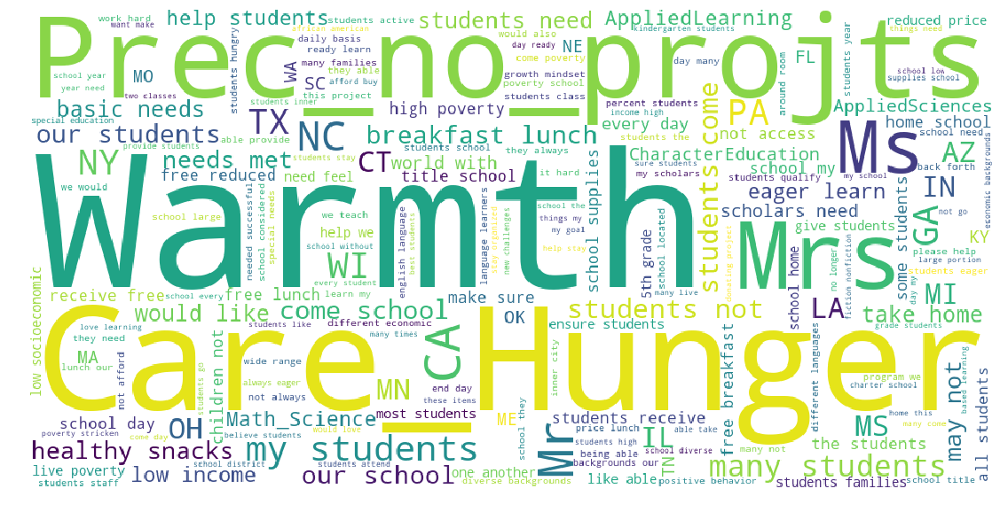

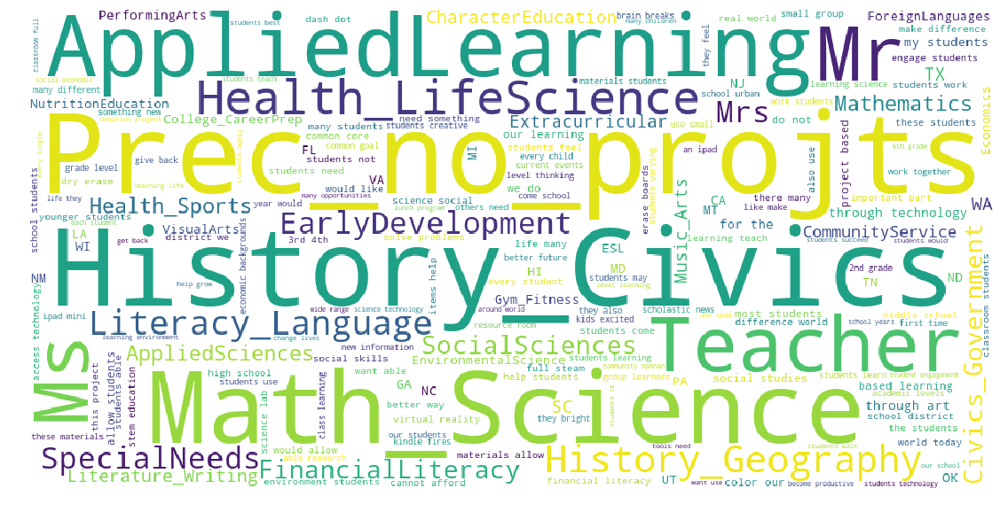

In [87]:
for i in labels[0:3]:
    clust = df_tfidf_5k_tr_d[df_tfidf_5k_tr_d['clusters'] == i].drop(['clusters'],axis=1)
    tp_freq = (clust.sum()).to_dict()
    wordcloud = WordCloud(width = 1000, height = 500, background_color ='white').generate_from_frequencies(tp_freq)
    plt.figure(figsize=(25,10))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
    plt.close()

In [93]:
from prettytable import PrettyTable

x_pretty_table = PrettyTable()
x_pretty_table.field_names = ["Model Type","Cluster","Data points","Eps","Cluster based on"]

x_pretty_table.add_row([ "DB Scan","Cluster 0",4923,2.5,'Regularly used words in daily student life '])
x_pretty_table.add_row([ "DB Scan","Cluster 1",53,2.5,'Care and humanity'])
x_pretty_table.add_row([ "DB Scan","Cluster -1",24,2.5,'Arts and science'])
print(x_pretty_table)

+------------+------------+-------------+-----+---------------------------------------------+
| Model Type |  Cluster   | Data points | Eps |               Cluster based on              |
+------------+------------+-------------+-----+---------------------------------------------+
|  DB Scan   | Cluster 0  |     4923    | 2.5 | Regularly used words in daily student life  |
|  DB Scan   | Cluster 1  |      53     | 2.5 |              Care and humanity              |
|  DB Scan   | Cluster -1 |      24     | 2.5 |               Arts and science              |
+------------+------------+-------------+-----+---------------------------------------------+
